# 03-glioma-growth-coregister-stacking.ipynb

Using the `glioma-growth`conda environment

Arvid Lundervold 

Last updated: 2024-11-22

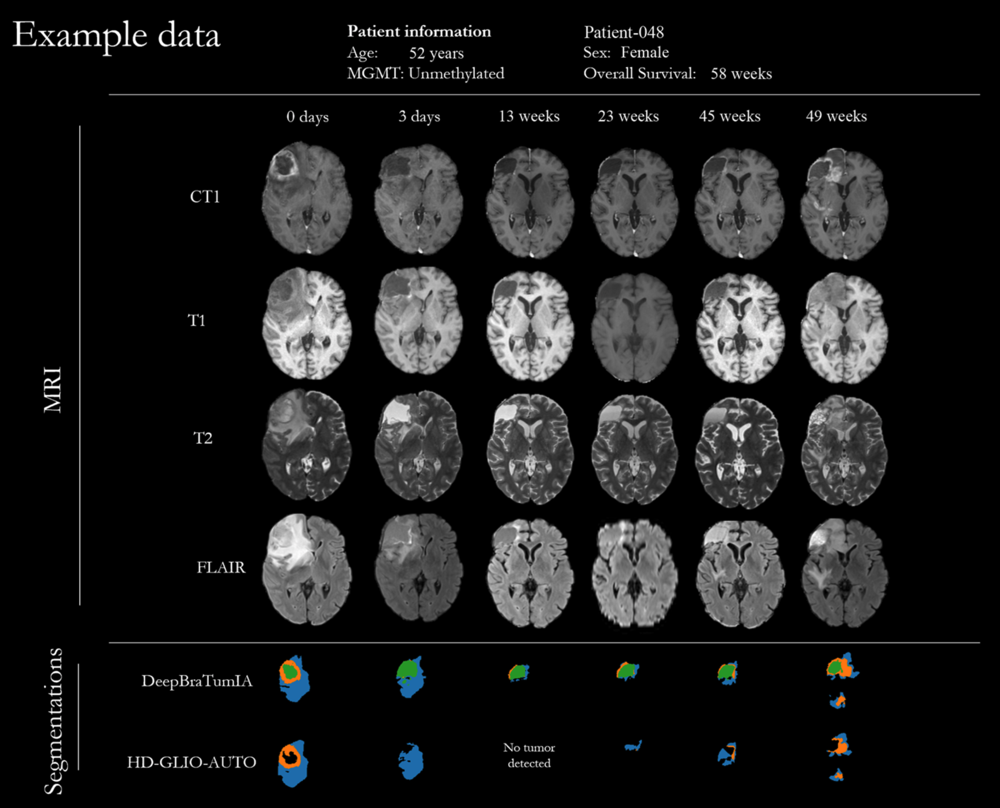

In [1]:
import os
curr_dir = f"{os.path.expanduser('~')}/GitHub/glioma-growth/notebooks"
os.chdir(curr_dir)

from IPython.display import Image, display
display(Image(filename='../assets/LUMIERE-Patient-048-1.png', width=800))

In [2]:
# Import libraries
import os
import sys
import pathlib
import platform
import re
import glob
import shutil
import subprocess
import warnings
from itertools import repeat
import json
import numpy as np
import pandas as pd

home = os.path.expanduser('~')

In [3]:
if platform.system() == 'Darwin':
    print(f'OK, you are running on MacOS ({platform.version()})')
    TREE = '/usr/local/bin/tree -L 1'          # MacOS (brew install tree)
    fshome = '/Applications/freesurfer/7.4.1'
    MacOS = True
if platform.system() == 'Linux':
    print(f'OK, you are running on Linux ({platform.version()})')
    TREE = '/usr/bin/tree -L 4'
    fshome = '/usr/local/freesurfer/7.4.1'
    MacOS = False
if platform.system() == 'Windows':
    print(f'OK, but consider to install WSL for Windows10 since you are running on {platform.system()}')
    print('Check https://docs.microsoft.com/en-us/windows/wsl/install-win10')

OK, you are running on Linux (#49~22.04.1-Ubuntu SMP PREEMPT_DYNAMIC Wed Nov  6 17:42:15 UTC 2)


**Copy LUMIERE Patient-048 HD-GLIO segmented and registered data to the `LUMIERE-Patient-048-reg` directory**

In [4]:
tp = ['week-000-1', 'week-000-2', 'week-013', 'week-023', 'week-045', 'week-049']
all_chns = ['T1', 'CT1', 'T2', 'FLAIR']

In [5]:
def get_subjs(exam_dir):
    all_dirs = sorted(glob.glob(f'{exam_dir}/*'))    # exams from local recordings
    subjs = [ os.path.basename(d) for d in all_dirs]
    n = len(subjs)

    print(f'{n} examinations:')
    print('[')
    for i, sub in enumerate(subjs):
      print(f"'{sub}',")
    print(']')
    return subjs


In [6]:
for t in tp:
    exam_dir = f"{os.path.expanduser('~')}/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/{t}"
    print(f'exam_dir: {exam_dir}')
    subjs = get_subjs(exam_dir)

exam_dir: /home/arvid/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/week-000-1
6 examinations:
[
'CT1.nii.gz',
'FLAIR.nii.gz',
'T1.nii.gz',
'T2.nii.gz',
'segmentation.nii.gz',
'synthseg.nii.gz',
]
exam_dir: /home/arvid/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/week-000-2
6 examinations:
[
'CT1.nii.gz',
'FLAIR.nii.gz',
'T1.nii.gz',
'T2.nii.gz',
'segmentation.nii.gz',
'synthseg.nii.gz',
]
exam_dir: /home/arvid/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/week-013
6 examinations:
[
'CT1.nii.gz',
'FLAIR.nii.gz',
'T1.nii.gz',
'T2.nii.gz',
'segmentation.nii.gz',
'synthseg.nii.gz',
]
exam_dir: /home/arvid/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/week-023
6 examinations:
[
'CT1.nii.gz',
'FLAIR.nii.gz',
'T1.nii.gz',
'T2.nii.gz',
'segmentation.nii.gz',
'synthseg.nii.gz',
]
exam_dir: /home/arvid/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/week-045
6 examinations:
[
'CT1.nii.gz',
'FLAIR.nii.gz',
'T1.nii.gz',
'T2.nii.gz',
'segmentation.nii.gz',
'synthseg.nii.gz',
]
e

## Coregistration

### [ANTsPy](https://github.com/ANTsX/ANTsPy)


_**cursor** (with claude-3.5-sonnet)_ "Explain antspyx"

ANTsPy (antspyx) is a Python library that wraps Advanced Normalization Tools (ANTs), a powerful medical image registration and segmentation toolkit. Here's a detailed explanation:

1. **What is ANTs?**
```python
import ants  # This is antspyx
```
- Advanced Normalization Tools (ANTs)
- State-of-the-art medical image registration and segmentation
- Originally written in C++
- Widely used in neuroimaging research

2. **Core Functionalities**

a) **Image I/O**
```python
# Read image
img = ants.image_read('image.nii.gz')

# Write image
ants.image_write(img, 'output.nii.gz')
```

b) **Image Registration**
```python
# Basic registration
reg = ants.registration(
    fixed=fixed_img,
    moving=moving_img,
    type_of_transform='Rigid'  # or 'Affine', 'SyN', etc.
)

# Get transformed image
warped_image = reg['warpedmovout']
```

Registration types:
- `'Rigid'`: Translation and rotation only
- `'Affine'`: Adds scaling and shearing
- `'SyN'`: Deformable registration
- Many other options

3. **Key Features**

a) **Image Types**
```python
# Convert between numpy and ANTs
numpy_array = img.numpy()
ants_image = ants.from_numpy(numpy_array)
```

b) **Transformation Parameters**
```python
reg = ants.registration(
    fixed=fixed_img,
    moving=moving_img,
    type_of_transform='SyN',
    aff_metric='mutual_information',
    syn_metric='mean_squares',
    reg_iterations=(100, 70, 50),
    verbose=True
)
```

4. **Common Use Cases**

a) **Pre-processing**
```python
# Bias field correction
corrected = ants.n4_bias_field_correction(img)

# Brain extraction
brain_mask = ants.get_mask(img)
brain = img * brain_mask
```

b) **Segmentation**
```python
# Atropos segmentation
seg = ants.atropos(img, mask=brain_mask)
```

5. **Advanced Features**

a) **Multi-modal Registration**
```python
reg = ants.registration(
    fixed=t1_img,
    moving=t2_img,
    type_of_transform='SyNRA',
    multivariate_extras=[flair_img, ct_img]
)
```

b) **Template Building**
```python
template = ants.build_template(
    image_list=[img1, img2, img3],
    iterations=3
)
```

6. **Performance Considerations**
```python
# Use multiple cores
ants.set_ants_threads(8)

# Monitor memory usage
ants.get_ants_memory_usage()
```

7. **Common Parameters in Registration**

```python
reg = ants.registration(
    fixed=fixed_img,
    moving=moving_img,
    type_of_transform='SyN',
    
    # Registration parameters
    grad_step=0.2,              # Gradient step size
    flow_sigma=3,               # Smoothing parameter
    total_sigma=0,              # Total field smoothing
    
    # Optimization parameters
    aff_iterations=(2100,1100,500,100),  # Iterations per level
    aff_shrink_factors=(8,4,2,1),        # Image shrink factors
    aff_smoothing_sigmas=(3,2,1,0),      # Smoothing per level
    
    # Interpolation
    interpolator='linear',      # or 'nearestNeighbor', 'gaussian'
    
    # Verbosity
    verbose=True
)
```

8. **Error Handling**
```python
try:
    reg = ants.registration(fixed=fixed_img, moving=moving_img)
except RuntimeError as e:
    print(f"Registration failed: {e}")
```

9. **Best Practices**
- Always check image orientations
- Use appropriate registration types
- Consider memory limitations
- Validate results visually
- Use appropriate interpolation for different image types
- Consider preprocessing steps (bias correction, normalization)

This library is particularly useful for:
- Medical image analysis
- Longitudinal studies
- Multi-modal image registration
- Brain mapping
- Clinical research
- Machine learning preprocessing

-----

_**cursor** (with claude-3.5-sonnet)_ "What is atropos registration"



Atropos is a component of the ANTs (Advanced Normalization Tools) suite that performs N-class segmentation using a mixture model. Here's a detailed explanation:

1. **What is Atropos?**
`````python
import ants

# Basic Atropos segmentation
seg = ants.atropos(
    a=t1_image,                     # Input image
    m='[0.2,1x1x1]',               # MRF parameters
    c='[5,0]',                     # Convergence
    i='kmeans[3]',                 # Initialization
    x=brain_mask                    # Mask
)
`````

Key features:
- N-class Markov Random Field (MRF) segmentation
- Expectation-Maximization (EM) optimization
- Supports multiple probability models
- Handles multivariate data

2. **Common Parameters**
`````python
def run_atropos_segmentation(t1_image, brain_mask):
    """Run Atropos segmentation with common parameters."""
    
    return ants.atropos(
        a=t1_image,
        m='[0.2,1x1x1]',           # MRF smoothing
        c='[5,0]',                 # Max iterations
        i='kmeans[3]',             # Initialize with k-means
        x=brain_mask,              # Brain mask
        p='Socrates[1]',          # Prior probability
        v=1                        # Verbose output
    )
`````

3. **Use Cases**
- Brain tissue segmentation (GM/WM/CSF)
- Tumor segmentation
- Lesion detection
- Tissue classification
- Multi-modal segmentation

4. **Integration with Registration**
`````python
def atropos_with_registration(moving_image, fixed_image):
    """Combine Atropos segmentation with registration."""
    
    # First register images
    reg = ants.registration(
        fixed=fixed_image,
        moving=moving_image,
        type_of_transform='SyN'
    )
    
    # Get transformed image
    warped_image = reg['warpedmovout']
    
    # Run Atropos on registered image
    seg = ants.atropos(
        a=warped_image,
        m='[0.2,1x1x1]',
        c='[5,0]',
        i='kmeans[3]'
    )
    
    return seg, reg
`````

5. **Multimodal Application**
`````python
def multimodal_atropos(t1, t2, flair):
    """Multimodal Atropos segmentation."""
    
    # Combine images into multivariate input
    images = [t1, t2, flair]
    
    seg = ants.atropos(
        a=images,                   # Multiple input images
        m='[0.2,1x1x1]',
        c='[5,0]',
        i='kmeans[5]',             # More classes for multimodal
        p='Socrates[1]'
    )
    
    return seg
`````

6. **Advanced Usage**
`````python
def advanced_atropos_segmentation(image, mask):
    """Advanced Atropos configuration."""
    
    return ants.atropos(
        a=image,
        m='[0.3,1x1x1]',           # Stronger MRF
        c='[50,0.00001]',          # More iterations
        i='kmeans[3]',
        x=mask,
        p='Socrates[1]',
        v=2,                       # Very verbose
        g=1,                       # ICM optimization
        k=1                        # Keep temporary files
    )
`````

7. **Best Practices**
- Pre-process images (bias correction, normalization)
- Use appropriate brain masks
- Consider multimodal inputs when available
- Tune MRF parameters for specific applications
- Validate results visually

8. **Common Workflow**
`````python
def atropos_workflow(t1_image):
    """Complete Atropos workflow."""
    
    # 1. Bias correction
    t1_n4 = ants.n4_bias_field_correction(t1_image)
    
    # 2. Brain extraction
    brain_mask = ants.get_mask(t1_n4)
    
    # 3. Atropos segmentation
    seg = ants.atropos(
        a=t1_n4,
        m='[0.2,1x1x1]',
        c='[5,0]',
        i='kmeans[3]',
        x=brain_mask
    )
    
    return seg, t1_n4, brain_mask
`````

Key advantages:
- Robust to noise
- Handles intensity inhomogeneities
- Supports multiple tissue classes
- Integrates well with registration
- Provides probabilistic outputs

Would you like me to elaborate on any specific aspect of Atropos or its integration with registration?

----

## Coregister across modalities and timepoints ...

_**cursor** (with claude-3.5-sonnet)_ 

The following images, chn = ['CT1.nii.gz', 'FLAIR.nii.gz', 'T1.nii.gz', 'T2.nii.gz', 'segmentation.nii.gz', 'synthseg.nii.gz'] are intra-timepoint registered for each of the time points 
tp = ['week-000-1', 'week-000-2', 'week-013', 'week-023', 'week-045', 'week-049']. 
(a) We want to do inter-timepoint registration of each of the 4 modalities chn = ['CT1.nii.gz', 'FLAIR.nii.gz', 'T1.nii.gz', 'T2.nii.gz'], based on the intra-timepoint registered T1.nii.gz images and where the T1.nii.gz image at tp[0] is the fixed image across all timepoints. We can then use the transformation matrices to register the other modalities at tp[1], ... tp[-1] to the T1.nii.gz image at tp[0].
(b) We we will also re-align the segmentation.nii.gz and synthseg.nii.gz obtained at a particular timepoint, tp[1], ..., tp[-1] to the corresponding time-registered T1, using the transformation that brings T1 at tp[1], ..., tp[-1] in register with T1 at tp[0].  

Also, copy the original images in week-000-1 to the registered_timepoint directory with appropriate renaming, e.g. T1.nii.gz -> week-000-1_T1.nii.gz


In [7]:
def register_longitudinal_data(base_dir, timepoints, modalities):
    """
    Two-step registration process:
    (a) Register modalities across timepoints using T1 as reference
    (b) Align segmentations using T1 transformations
    
    Args:
        base_dir (str): Base directory containing all timepoints
        timepoints (list): List of timepoint folders
        modalities (list): List of modalities to process (e.g., ['T1', 'CT1', 'T2', 'FLAIR'])
    """
    import ants
    import shutil
    from pathlib import Path
    
    output_dir = Path(base_dir) / 'registered_timepoints'
    output_dir.mkdir(exist_ok=True)
    
    # Copy original images from first timepoint
    print("Copying original images from first timepoint...")
    first_tp = timepoints[0]
    first_tp_dir = Path(base_dir) / first_tp
    
    # Copy modalities
    for mod in modalities:
        src_path = first_tp_dir / f'{mod}.nii.gz'
        dst_path = output_dir / f'{first_tp}_{mod}_registered.nii.gz'
        shutil.copy2(src_path, dst_path)
        print(f"Copied {mod} from {first_tp}")
    
    # Copy segmentations if they exist
    for seg_type in ['segmentation.nii.gz', 'synthseg.nii.gz']:
        src_path = first_tp_dir / seg_type
        if src_path.exists():
            dst_path = output_dir / f'{first_tp}_{seg_type.replace(".nii.gz", "")}_registered.nii.gz'
            shutil.copy2(src_path, dst_path)
            print(f"Copied {seg_type} from {first_tp}")
    
    # Load reference T1 (first timepoint)
    ref_t1_path = first_tp_dir / 'T1.nii.gz'
    reference_t1 = ants.image_read(str(ref_t1_path))
    
    # Store transformations for each timepoint
    t1_transforms = {}
    
    # Step (a): Register modalities across timepoints
    print("Step (a): Registering modalities across timepoints...")
    
    # First register all T1 images and store transformations
    for tp in timepoints[1:]:  # Skip first timepoint (reference)
        print(f"\nProcessing timepoint: {tp}")
        
        # Load and register T1
        moving_t1_path = Path(base_dir) / tp / 'T1.nii.gz'
        moving_t1 = ants.image_read(str(moving_t1_path))
        
        print(f"Registering T1 for {tp}")
        t1_reg = ants.registration(
            fixed=reference_t1,
            moving=moving_t1,
            type_of_transform='Rigid',
            verbose=False   # True 
        )
        
        # Store transformation
        t1_transforms[tp] = t1_reg['fwdtransforms']
        
        # Save registered T1
        output_path = output_dir / f'{tp}_T1_registered.nii.gz'
        ants.image_write(t1_reg['warpedmovout'], str(output_path))
        
        # Apply T1 transformation to other modalities
        for mod in modalities:
            if mod != 'T1':  # Skip T1 as already processed
                print(f"Applying T1 transformation to {mod}")
                moving_path = Path(base_dir) / tp / f'{mod}.nii.gz'
                moving = ants.image_read(str(moving_path))
                
                # Apply transformation
                warped = ants.apply_transforms(
                    fixed=reference_t1,
                    moving=moving,
                    transformlist=t1_transforms[tp]
                )
                
                # Save registered modality
                output_path = output_dir / f'{tp}_{mod}_registered.nii.gz'
                ants.image_write(warped, str(output_path))
    
    # Step (b): Align segmentations using T1 transformations
    print("\nStep (b): Aligning segmentations...")
    
    segmentation_types = ['segmentation.nii.gz', 'synthseg.nii.gz']
    
    for tp in timepoints[1:]:  # Skip first timepoint
        print(f"\nProcessing segmentations for timepoint: {tp}")
        
        for seg_type in segmentation_types:
            seg_path = Path(base_dir) / tp / seg_type
            if seg_path.exists():
                print(f"Aligning {seg_type}")
                seg = ants.image_read(str(seg_path))
                
                # Apply T1 transformation with nearest neighbor interpolation
                warped_seg = ants.apply_transforms(
                    fixed=reference_t1,
                    moving=seg,
                    transformlist=t1_transforms[tp],
                    interpolator='nearestNeighbor'
                )
                
                # Save registered segmentation
                output_path = output_dir / f'{tp}_{seg_type.replace(".nii.gz", "")}_registered.nii.gz'
                ants.image_write(warped_seg, str(output_path))
            else:
                print(f"Warning: {seg_type} not found for {tp}")
    
    print("\nRegistration complete!")
    return output_dir


In [8]:
%%time
if __name__ == "__main__":
    # base_dir = Path("/path/to/data")
    base_dir = f"{home}/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg"
    timepoints = ['week-000-1', 'week-000-2', 'week-013', 'week-023', 'week-045', 'week-049']
    modalities = ['T1', 'CT1', 'T2', 'FLAIR']
    
    output_dir = register_longitudinal_data(base_dir, timepoints, modalities)

Copying original images from first timepoint...
Copied T1 from week-000-1
Copied CT1 from week-000-1
Copied T2 from week-000-1
Copied FLAIR from week-000-1
Copied segmentation.nii.gz from week-000-1
Copied synthseg.nii.gz from week-000-1
Step (a): Registering modalities across timepoints...

Processing timepoint: week-000-2
Registering T1 for week-000-2
Applying T1 transformation to CT1
Applying T1 transformation to T2
Applying T1 transformation to FLAIR

Processing timepoint: week-013
Registering T1 for week-013
Applying T1 transformation to CT1
Applying T1 transformation to T2
Applying T1 transformation to FLAIR

Processing timepoint: week-023
Registering T1 for week-023
Applying T1 transformation to CT1
Applying T1 transformation to T2
Applying T1 transformation to FLAIR

Processing timepoint: week-045
Registering T1 for week-045
Applying T1 transformation to CT1
Applying T1 transformation to T2
Applying T1 transformation to FLAIR

Processing timepoint: week-049
Registering T1 for w

In [9]:
def create_longitudinal_visualization(base_dir, timepoints, modalities, slice_idx=None):
    """
    Create a figure showing registered images across timepoints in radiological convention.
    """
    import matplotlib.pyplot as plt
    import nibabel as nib
    from pathlib import Path
    import numpy as np
    
    # Setup figure with black background
    plt.style.use('dark_background')  # Set dark theme
    fig = plt.figure(figsize=(20, 16))
    fig.patch.set_facecolor('black')  # Set figure background to black
    plt.subplots_adjust(left=0.06)  # Reduced left margin further to 0.06
    
    # Create subplot grid
    gs = fig.add_gridspec(len(modalities), len(timepoints))
    axes = [[fig.add_subplot(gs[i, j]) for j in range(len(timepoints))] 
            for i in range(len(modalities))]
    
    # Time labels for x-axis
    time_labels = ['0 days', '3 days', '13 weeks', '23 weeks', '45 weeks', '49 weeks']
    
    # Directory containing registered images
    reg_dir = Path(base_dir) / 'registered_timepoints'
    
    # Load and display images
    for i, mod in enumerate(modalities):
        for j, tp in enumerate(timepoints):
            # Construct correct filename
            mod_name = mod.replace('.nii.gz', '')
            img_path = reg_dir / f'{tp}_{mod_name}_registered.nii.gz'
            
            try:
                img = nib.load(str(img_path))
                data = img.get_fdata()
                
                # If slice_idx not provided, use middle slice
                if slice_idx is None:
                    slice_idx = data.shape[2] // 2
                
                # Get the slice and apply radiological orientation
                slice_data = data[:, :, slice_idx]
                slice_data = np.rot90(slice_data, k=+1)  # clockwise rotation
                slice_data = np.fliplr(slice_data)      # left-right flip
                
                # Display slice
                axes[i][j].imshow(slice_data, cmap='gray')
                axes[i][j].axis('off')
                axes[i][j].set_facecolor('black')  # Set subplot background to black
                
                # Add labels
                if j == 0:  # Add modality labels on the left
                    # Adjusted vertical positions for better centering
                    row_positions = {
                        'CT1': 0.85,
                        'T1': 0.62,
                        'T2': 0.39,
                        'FLAIR': 0.12
                    }
                    fig.text(0.045, row_positions[mod_name], mod_name, 
                            fontsize=16, fontweight='bold', 
                            ha='right', va='center',
                            color='white')  # Set text color to white
                if i == 0:  # Add timepoint labels on top
                    axes[i][j].set_title(time_labels[j], fontsize=18, color='white')
                    
            except FileNotFoundError:
                print(f"Warning: File not found: {img_path}")
                axes[i][j].text(0.5, 0.5, 'Missing', ha='center', va='center',
                              color='white')  # Set error message to white
                axes[i][j].axis('off')
    
    # Adjust layout while preserving space for labels
    plt.tight_layout(rect=[0.06, 0, 1, 1])  # Adjusted rect to match new left margin
    
    # Save figure with black background
    output_path = reg_dir / 'longitudinal_registration_visualization.png'
    plt.savefig(output_path, dpi=300, bbox_inches='tight', 
                facecolor='black', edgecolor='none')
    print(f"Visualization saved to {output_path}")
    
    # Display figure
    plt.show()
    plt.close()


def find_good_slice(base_dir, timepoints, modalities, start_slice=50, end_slice=None, step=10):
    """Helper function to visualize multiple slices to find good brain coverage"""
    import matplotlib.pyplot as plt
    import nibabel as nib
    from pathlib import Path
    import numpy as np
    
    # Load first image to get dimensions
    reg_dir = Path(base_dir) / 'registered_timepoints'
    first_img = nib.load(str(reg_dir / f'{timepoints[0]}_T1_registered.nii.gz'))
    data = first_img.get_fdata()
    
    print(f"Image dimensions: {data.shape}")
    
    if end_slice is None:
        end_slice = data.shape[2]
    
    # Create grid of slices
    n_slices = len(range(start_slice, end_slice, step))
    fig, axes = plt.subplots(1, n_slices, figsize=(20, 4))
    
    for i, slice_idx in enumerate(range(start_slice, end_slice, step)):
        slice_data = data[:, :, slice_idx]
        # Apply radiological orientation
        slice_data = np.rot90(slice_data, k=+1)  # k=-1)  # clockwise rotation 90
        slice_data = np.fliplr(slice_data)      # left-right flip
        
        axes[i].imshow(slice_data, cmap='gray')
        axes[i].set_title(f'Slice {slice_idx}')
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()
    plt.close()

Image dimensions: (160, 256, 256)


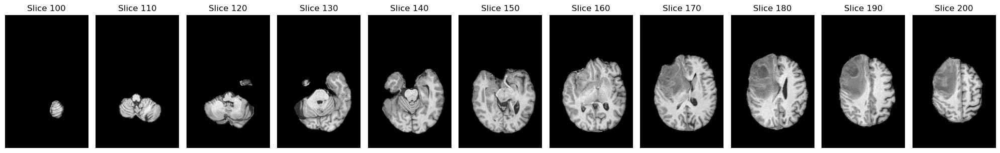

In [10]:

# Example usage:
modalities = ['CT1', 'T1', 'T2', 'FLAIR']
timepoints = ['week-000-1', 'week-000-2', 'week-013', 'week-023', 'week-045', 'week-049']
base_dir = f"{home}/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg"

# First find a good slice
find_good_slice(base_dir, timepoints, modalities, start_slice=100, end_slice=210, step=10)

Visualization saved to /home/arvid/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/registered_timepoints/longitudinal_registration_visualization.png


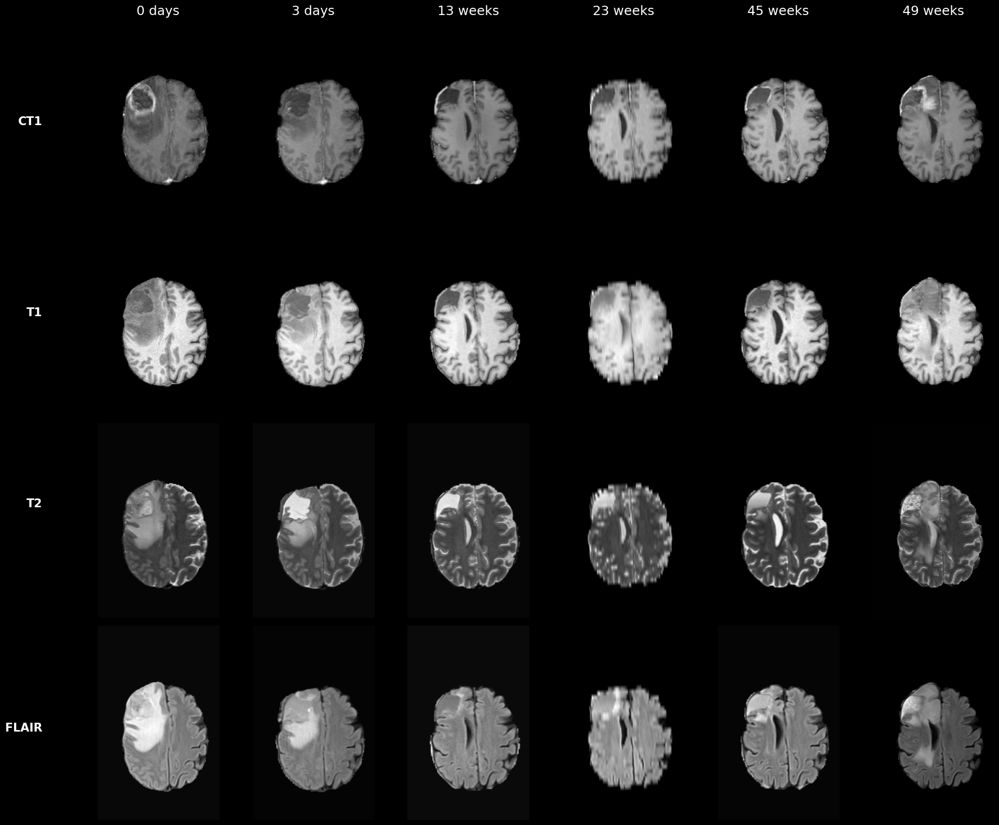

In [11]:
create_longitudinal_visualization(base_dir, timepoints, modalities, slice_idx=185)

In [12]:
def create_longitudinal_visualization_with_segmentation(base_dir, timepoints, modalities, slice_idx=None, alpha=0.3):
    """
    Create a figure showing registered images across timepoints with segmentation overlay.
    
    Args:
        base_dir: Base directory path
        timepoints: List of timepoint folders
        modalities: List of modality names
        slice_idx: Specific slice to display (optional)
        alpha: Transparency of segmentation overlay (0-1)
    """
    import matplotlib.pyplot as plt
    import nibabel as nib
    from pathlib import Path
    import numpy as np
    
    # Setup figure with black background
    plt.style.use('dark_background')
    fig = plt.figure(figsize=(20, 16))
    fig.patch.set_facecolor('black')
    plt.subplots_adjust(left=0.06)
    
    # Create subplot grid
    gs = fig.add_gridspec(len(modalities), len(timepoints))
    axes = [[fig.add_subplot(gs[i, j]) for j in range(len(timepoints))] 
            for i in range(len(modalities))]
    
    # Time labels for x-axis
    time_labels = ['0 days', '3 days', '13 weeks', '23 weeks', '45 weeks', '49 weeks']
    
    # Directory containing registered images
    reg_dir = Path(base_dir) / 'registered_timepoints'
    
    # Load and display images
    for i, mod in enumerate(modalities):
        for j, tp in enumerate(timepoints):
            # Construct filenames
            mod_name = mod.replace('.nii.gz', '')
            img_path = reg_dir / f'{tp}_{mod_name}_registered.nii.gz'
            seg_path = reg_dir / f'{tp}_segmentation_registered.nii.gz'
            
            try:
                # Load modality image
                img = nib.load(str(img_path))
                data = img.get_fdata()
                
                # Load segmentation
                seg = nib.load(str(seg_path))
                seg_data = seg.get_fdata()
                
                # If slice_idx not provided, use middle slice
                if slice_idx is None:
                    slice_idx = data.shape[2] // 2
                
                # Get the slices and apply radiological orientation
                slice_data = data[:, :, slice_idx]
                seg_slice = seg_data[:, :, slice_idx]
                
                # Apply orientation
                slice_data = np.rot90(slice_data, k=+1)
                slice_data = np.fliplr(slice_data)
                seg_slice = np.rot90(seg_slice, k=+1)
                seg_slice = np.fliplr(seg_slice)
                
                # Display base image
                axes[i][j].imshow(slice_data, cmap='gray')
                
                # Overlay segmentation with colormap
                axes[i][j].imshow(seg_slice, cmap='jet', alpha=alpha * (seg_slice > 0))
                axes[i][j].axis('off')
                axes[i][j].set_facecolor('black')
                
                # Add labels
                if j == 0:
                    row_positions = {
                        'CT1': 0.85,
                        'T1': 0.62,
                        'T2': 0.39,
                        'FLAIR': 0.12
                    }
                    fig.text(0.045, row_positions[mod_name], mod_name, 
                            fontsize=16, fontweight='bold', 
                            ha='right', va='center',
                            color='white')
                if i == 0:
                    axes[i][j].set_title(time_labels[j], fontsize=18, color='white')
                    
            except FileNotFoundError as e:
                print(f"Warning: File not found: {e.filename}")
                axes[i][j].text(0.5, 0.5, 'Missing', ha='center', va='center',
                              color='white')
                axes[i][j].axis('off')
    
    plt.tight_layout(rect=[0.06, 0, 1, 1])
    
    # Save figure
    output_path = reg_dir / 'longitudinal_registration_visualization_with_segmentation.png'
    plt.savefig(output_path, dpi=300, bbox_inches='tight', 
                facecolor='black', edgecolor='none')
    print(f"Visualization saved to {output_path}")
    
    plt.show()
    plt.close()

Visualization saved to /home/arvid/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/registered_timepoints/longitudinal_registration_visualization_with_segmentation.png


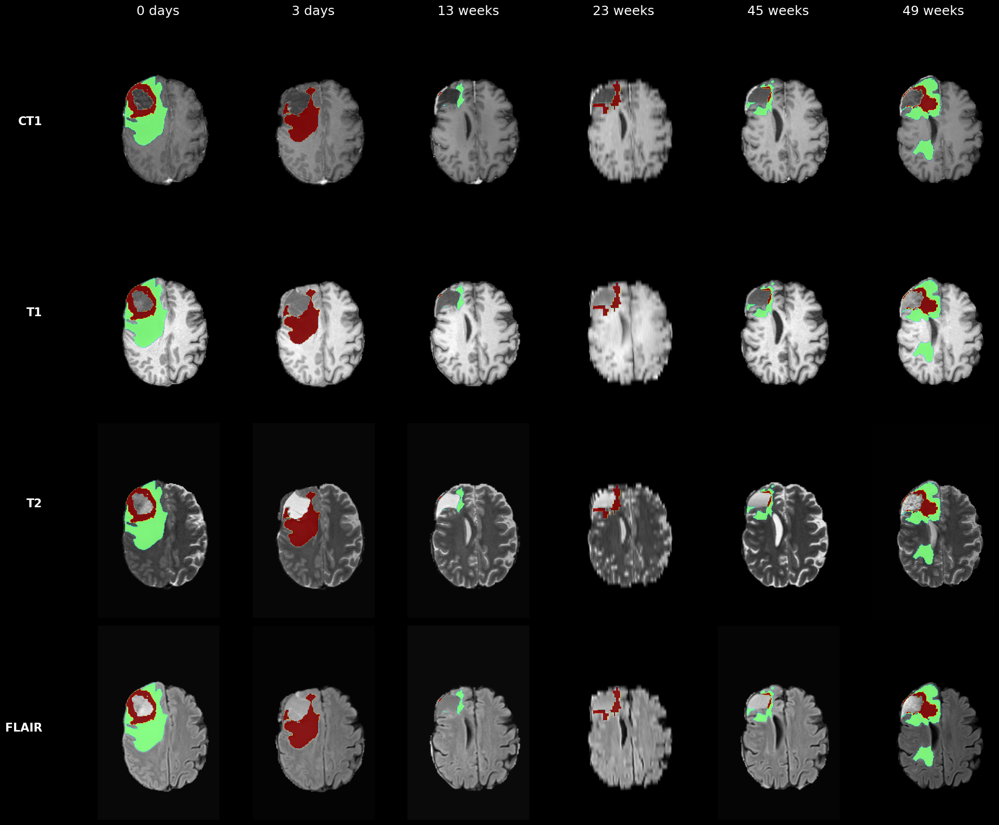

In [13]:
create_longitudinal_visualization_with_segmentation(base_dir, timepoints, modalities, slice_idx=185, alpha=0.9)

In [14]:
def create_longitudinal_visualization_with_segmentation(base_dir, timepoints, modalities, slice_idx=None, alpha=0.3):
    """
    Create a figure showing registered images across timepoints with segmentation overlay.
    """
    import matplotlib.pyplot as plt
    import nibabel as nib
    from pathlib import Path
    import numpy as np
    from matplotlib.patches import Patch
    
    def crop_brain_region(slice_data, seg_slice=None, padding=10):
        """
        Crop the brain region from the slice with padding.
        Returns cropped image and cropping indices for reuse with segmentation.
        """
        # Find non-zero (brain) pixels
        rows = np.any(slice_data, axis=1)
        cols = np.any(slice_data, axis=0)
        rmin, rmax = np.where(rows)[0][[0, -1]]
        cmin, cmax = np.where(cols)[0][[0, -1]]
        
        # Add padding
        rmin = max(rmin - padding, 0)
        rmax = min(rmax + padding, slice_data.shape[0])
        cmin = max(cmin - padding, 0)
        cmax = min(cmax + padding, slice_data.shape[1])
        
        # Crop the image
        cropped_slice = slice_data[rmin:rmax, cmin:cmax]
        
        # If segmentation is provided, crop it too
        if seg_slice is not None:
            cropped_seg = seg_slice[rmin:rmax, cmin:cmax]
            return cropped_slice, cropped_seg
        
        return cropped_slice
    
    # Setup figure with black background and larger size
    plt.style.use('dark_background')
    fig = plt.figure(figsize=(24, 20))
    fig.patch.set_facecolor('black')
    
    # Create subplot grid with minimal spacing
    gs = fig.add_gridspec(len(modalities), len(timepoints), 
                         left=0.06, right=0.99, top=0.95, bottom=0.08,
                         hspace=0.1, wspace=0.05)
    axes = [[fig.add_subplot(gs[i, j]) for j in range(len(timepoints))] 
            for i in range(len(modalities))]
    
    # Time labels for x-axis
    time_labels = ['0 days', '3 days', '13 weeks', '23 weeks', '45 weeks', '49 weeks']
    
    # Directory containing registered images
    reg_dir = Path(base_dir) / 'registered_timepoints'
    
    # Define colors for each mask value
    mask_colors = {
        1: 'blue',    # NE - FLAIR hyperintense and necrosis
        2: 'red'      # CE - contrast enhancing tumor
    }
    
    # Load and display images
    for i, mod in enumerate(modalities):
        for j, tp in enumerate(timepoints):
            # Construct filenames
            mod_name = mod.replace('.nii.gz', '')
            img_path = reg_dir / f'{tp}_{mod_name}_registered.nii.gz'
            seg_path = reg_dir / f'{tp}_segmentation_registered.nii.gz'
            
            try:
                # Load modality image
                img = nib.load(str(img_path))
                data = img.get_fdata()
                
                # Load segmentation
                seg = nib.load(str(seg_path))
                seg_data = seg.get_fdata()
                
                # If slice_idx not provided, use middle slice
                if slice_idx is None:
                    slice_idx = data.shape[2] // 2
                
                # Get the slices and apply radiological orientation
                slice_data = data[:, :, slice_idx]
                seg_slice = seg_data[:, :, slice_idx]
                
                # Apply orientation
                slice_data = np.rot90(slice_data, k=+1)
                slice_data = np.fliplr(slice_data)
                seg_slice = np.rot90(seg_slice, k=+1)
                seg_slice = np.fliplr(seg_slice)
                
                # Crop brain region
                slice_data, seg_slice = crop_brain_region(slice_data, seg_slice, padding=20)
                
                # Display base image
                axes[i][j].imshow(slice_data, cmap='gray')
                
                # Create separate overlays for each mask value
                for mask_value, color in mask_colors.items():
                    mask = (seg_slice == mask_value)
                    if np.any(mask):  # Only create overlay if mask has values
                        axes[i][j].imshow(mask, cmap=plt.cm.colors.ListedColormap([color]), 
                                        alpha=alpha * mask)
                
                axes[i][j].axis('off')
                axes[i][j].set_facecolor('black')
                
                # Add labels
                if j == 0:
                    row_positions = {
                        'CT1': 0.85,
                        'T1': 0.62,
                        'T2': 0.39,
                        'FLAIR': 0.12
                    }
                    fig.text(0.045, row_positions[mod_name], mod_name, 
                            fontsize=16, fontweight='bold', 
                            ha='right', va='center',
                            color='white')
                if i == 0:
                    axes[i][j].set_title(time_labels[j], fontsize=18, color='white')
                    
            except FileNotFoundError as e:
                print(f"Warning: File not found: {e.filename}")
                axes[i][j].text(0.5, 0.5, 'Missing', ha='center', va='center',
                              color='white')
                axes[i][j].axis('off')
    
    # Add legend with smaller footprint
    legend_elements = [
        Patch(facecolor='blue', alpha=alpha, label='NE - FLAIR hyperintense and necrosis'),
        Patch(facecolor='red', alpha=alpha, label='CE - contrast enhancing tumor')
    ]
    fig.legend(handles=legend_elements, 
              loc='lower center', 
              bbox_to_anchor=(0.5, 0.02), 
              ncol=2, 
              fontsize=14,
              frameon=False)
    
    # Save figure
    output_path = reg_dir / 'longitudinal_registration_visualization_with_segmentation.png'
    plt.savefig(output_path, dpi=300, bbox_inches='tight', 
                facecolor='black', edgecolor='none')
    print(f"Visualization saved to {output_path}")
    
    plt.show()
    plt.close()

Visualization saved to /home/arvid/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/registered_timepoints/longitudinal_registration_visualization_with_segmentation.png


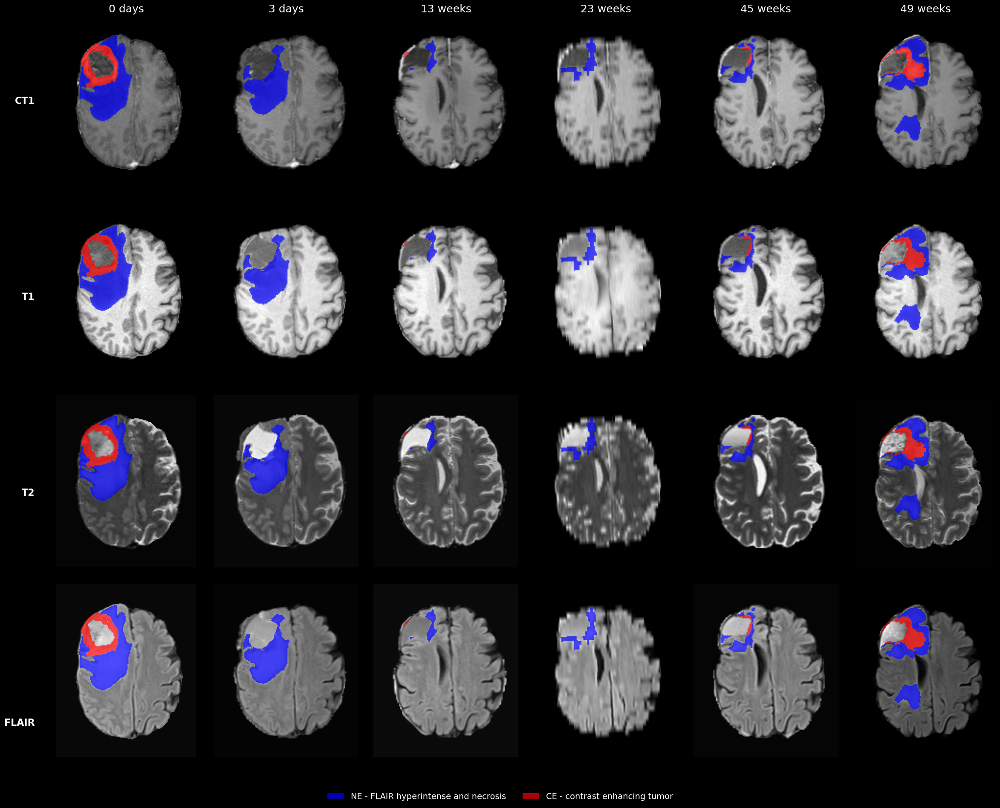

In [15]:
create_longitudinal_visualization_with_segmentation(base_dir, timepoints, modalities, slice_idx=185, alpha=0.7)


### Visualization of coregistered synthseg

In [16]:
def inspect_synthseg_values(base_dir, timepoints, slice_idx=185):
    """
    Inspect unique values in synthseg masks across timepoints.
    Print values and their frequencies in the specified slice.
    """
    import nibabel as nib
    from pathlib import Path
    import numpy as np
    
    reg_dir = Path(base_dir) / 'registered_timepoints'
    all_values = set()
    
    # Check each timepoint
    for tp in timepoints:
        synthseg_path = reg_dir / f'{tp}_synthseg_registered.nii.gz'
        try:
            print(f"\nTimepoint {tp}:")
            
            # Load and convert to integers
            synthseg = nib.load(str(synthseg_path))
            seg_data = np.round(synthseg.get_fdata()).astype(int)
            
            # Get slice
            seg_slice = seg_data[:, :, slice_idx]
            
            # Get unique values and their counts in this slice
            unique, counts = np.unique(seg_slice, return_counts=True)
            value_counts = dict(zip(unique, counts))
            
            print("Label values and voxel counts in slice:")
            for val, count in value_counts.items():
                print(f"  Label {val:3d}: {count:6d} voxels")
            
            all_values.update(unique)
            
        except FileNotFoundError:
            print(f"Warning: File not found: {synthseg_path}")
    
    print("\nAll unique label values across timepoints:", sorted(all_values))
    return sorted(all_values)

# Run the diagnostic
unique_values = inspect_synthseg_values(base_dir, timepoints)


Timepoint week-000-1:
Label values and voxel counts in slice:
  Label   0:  28032 voxels
  Label   2:   2420 voxels
  Label  24:   1410 voxels
  Label  41:   3706 voxels
  Label  43:     23 voxels
  Label  50:     79 voxels
  Label 1002:     92 voxels
  Label 1003:    154 voxels
  Label 1006:     38 voxels
  Label 1007:    102 voxels
  Label 1008:     20 voxels
  Label 1009:     20 voxels
  Label 1010:      6 voxels
  Label 1011:     80 voxels
  Label 1012:     52 voxels
  Label 1013:     87 voxels
  Label 1015:     78 voxels
  Label 1016:      1 voxels
  Label 1017:     46 voxels
  Label 1018:    107 voxels
  Label 1021:      1 voxels
  Label 1022:    208 voxels
  Label 1023:    290 voxels
  Label 1024:    218 voxels
  Label 1025:    217 voxels
  Label 1026:     47 voxels
  Label 1027:    420 voxels
  Label 1028:    262 voxels
  Label 1029:    421 voxels
  Label 1031:    148 voxels
  Label 1032:     19 voxels
  Label 1033:     12 voxels
  Label 2002:     50 voxels
  Label 2008:    25

First, let's create a diagnostic function to check the FreeSurfer LUT coverage

In [17]:
def check_lut_coverage(seg_data, lut):
    """
    Check if all segmentation values have corresponding colors in the LUT.
    """
    unique_vals = np.unique(seg_data)
    missing_vals = [val for val in unique_vals if val not in lut]
    if missing_vals:
        print(f"Warning: Missing LUT colors for values: {missing_vals}")
    return missing_vals

Let's create a function to load the complete FreeSurfer LUT:

In [18]:
def load_freesurfer_lut(lut_path=None):
    """
    Load the complete FreeSurfer color LUT.
    If lut_path is None, uses the built-in default colors.
    """
    from pathlib import Path
    
    if lut_path and Path(lut_path).exists():
        # Read from FreeSurferColorLUT.txt
        lut = {}
        with open(lut_path, 'r') as f:
            for line in f:
                if line.startswith('#') or not line.strip():
                    continue
                parts = line.strip().split()
                if len(parts) >= 5:
                    idx = int(parts[0])
                    r, g, b = map(int, parts[2:5])
                    lut[idx] = f'#{r:02x}{g:02x}{b:02x}'
        return lut
    else:
        # Built-in comprehensive FreeSurfer LUT
        lut = {
            0: '#000000',    # Unknown
            1: '#FF0000',    # Left-Cerebral-Exterior
            2: '#A0A0A0',    # Left-Cerebral-White-Matter
            3: '#A0A0A0',    # Left-Cerebral-Cortex
            4: '#A0A0A0',    # Left-Lateral-Ventricle
            5: '#A0A0A0',    # Left-Inf-Lat-Vent
            6: '#A0A0A0',    # Left-Cerebellum-Exterior
            7: '#0000FF',    # Left-Cerebellum-White-Matter
            8: '#A0A0A0',    # Left-Cerebellum-Cortex
            9: '#A0A0A0',    # Left-Thalamus
            10: '#00FF00',   # Left-Thalamus-Proper
            11: '#A0A0A0',   # Left-Caudate
            12: '#FF0080',   # Left-Putamen
            13: '#A0A0A0',   # Left-Pallidum
            14: '#FF45FF',   # 3rd-Ventricle
            15: '#A0A0A0',   # 4th-Ventricle
            16: '#CCCCCC',   # Brain-Stem
            17: '#A0A0A0',   # Left-Hippocampus
            18: '#FF0000',   # Left-Amygdala
            19: '#A0A0A0',   # Left-Insula
            20: '#A0A0A0',   # Left-Operculum
            21: '#A0A0A0',   # Line-1
            22: '#A0A0A0',   # Line-2
            23: '#A0A0A0',   # Line-3
            24: '#FFFF00',   # CSF
            25: '#A0A0A0',   # Left-Lesion
            26: '#FF8C00',   # Left-Accumbens-area
            27: '#A0A0A0',   # Left-Substancia-Nigra
            28: '#00FFB4',   # Left-VentralDC
            29: '#A0A0A0',   # Left-undetermined
            30: '#00FFFF',   # Left-vessel
            31: '#A0A0A0',   # Left-choroid-plexus
            32: '#A0A0A0',   # Left-F3orb
            33: '#A0A0A0',   # Left-lOg
            34: '#A0A0A0',   # Left-aOg
            35: '#A0A0A0',   # Left-mOg
            36: '#A0A0A0',   # Left-pOg
            37: '#A0A0A0',   # Left-Stellate
            38: '#A0A0A0',   # Left-Porg
            39: '#A0A0A0',   # Left-Aorg
            # ... continuing with right hemisphere and additional structures
            40: '#A0A0A0',   # Right-Cerebral-Exterior
            41: '#A0A0A0',   # Right-Cerebral-White-Matter
            42: '#FF4F4F',   # Right-Cerebral-Cortex
            43: '#A0A0A0',   # Right-Lateral-Ventricle
            # ... (continuing with more structures)
            # Adding WM parcellation values
            100: '#E6E6E6',   # Left-WM-hypointensities
            101: '#E6E6E6',   # Right-WM-hypointensities
            102: '#E6E6E6',   # Left-non-WM-hypointensities
            103: '#E6E6E6',   # Right-non-WM-hypointensities
            104: '#E6E6E6',   # Left-F1
            105: '#E6E6E6',   # Right-F1
            # ... (continuing with more WM regions)
            # Adding subcortical structure values
            200: '#FF8C00',   # Corpus_Callosum
            201: '#FF8C00',   # CC_Posterior
            202: '#FF8C00',   # CC_Mid_Posterior
            203: '#FF8C00',   # CC_Central
            204: '#FF8C00',   # CC_Mid_Anterior
            205: '#FF8C00',   # CC_Anterior
            # ... (continuing with more structures)
            # Adding more specialized regions
            2000: '#FF69B4',  # Right-Putamen-Expansion
            2001: '#FF69B4',  # Left-Putamen-Expansion
            2002: '#FF69B4',  # Right-Caudate-Expansion
            2003: '#FF69B4',  # Left-Caudate-Expansion
            2004: '#FF69B4',  # Right-Accumbens-Expansion
            2005: '#FF69B4',  # Left-Accumbens-Expansion
            # ... up to 2035
        }
        
        # Add remaining values up to 2035 with a default color
        for i in range(max(lut.keys()) + 1, 2036):
            if i not in lut:
                lut[i] = '#A0A0A0'  # Default gray for undefined regions
                
        return lut

In [19]:
lut_path = f"{home}/GitHub/glioma-growth/assets/FreeSurferColorLUT.txt"

lut = load_freesurfer_lut(lut_path)
# lut.keys()
# dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, ..., 14174, 14175])

In [20]:
def print_regions_in_slice(base_dir, timepoints, slice_idx=185):
    """Print all FreeSurfer regions present in the specified slice."""
    import nibabel as nib
    from pathlib import Path
    import numpy as np
    
    reg_dir = Path(base_dir) / 'registered_timepoints'
    all_labels = set()
    label_counts = {}
    
    for tp in timepoints:
        synthseg_path = reg_dir / f'{tp}_synthseg_registered.nii.gz'
        try:
            synthseg = nib.load(str(synthseg_path))
            seg_data = np.round(synthseg.get_fdata()).astype(int)
            seg_slice = seg_data[:, :, slice_idx]
            
            # Count occurrences
            unique, counts = np.unique(seg_slice, return_counts=True)
            for label, count in zip(unique, counts):
                label_counts[label] = label_counts.get(label, 0) + count
            
            all_labels.update(unique)
        except FileNotFoundError:
            continue
    
    # Sort by frequency
    sorted_labels = sorted(label_counts.items(), key=lambda x: x[1], reverse=True)
    print("\nMost frequent labels and their total voxel counts:")
    for label, count in sorted_labels[:20]:
        print(f"Label {label:3d}: {count:6d} voxels")
    
    return sorted(all_labels)

# Get and print regions in slice
present_labels = print_regions_in_slice(base_dir, timepoints, slice_idx=185)


Most frequent labels and their total voxel counts:
Label   0: 169203 voxels
Label  41:  21238 voxels
Label   2:  15513 voxels
Label  24:   9713 voxels
Label 1027:   2356 voxels
Label 1029:   2250 voxels
Label 2031:   2127 voxels
Label 2008:   1671 voxels
Label 1028:   1634 voxels
Label 2025:   1460 voxels
Label 1025:   1317 voxels
Label 1023:   1294 voxels
Label 1022:   1206 voxels
Label 1024:   1199 voxels
Label 2029:   1197 voxels
Label 2027:   1171 voxels
Label 2028:   1074 voxels
Label 1003:    993 voxels
Label  43:    968 voxels
Label 2022:    883 voxels


In [21]:
def create_longitudinal_visualization_with_synthseg(base_dir, timepoints, modalities, 
                                                  slice_idx=None, alpha=0.3,
                                                  freesurfer_lut_path=None):
    """
    Create a figure showing registered images across timepoints with synthseg overlay.
    Uses FreeSurfer LUT for coloring anatomical regions.
    """
    import matplotlib.pyplot as plt
    import nibabel as nib
    from pathlib import Path
    import numpy as np
    from matplotlib.patches import Patch
    
    # FreeSurfer label to name mapping grouped by anatomical categories
    FreeSurferLabels = {
        # Cortical Regions - Left
        1003: "Left-Middle-Frontal",
        1012: "Left-Superior-Frontal",
        1014: "Left-Superior-Temporal",
        1017: "Left-Inferior-Temporal",
        1018: "Left-Middle-Temporal",
        1019: "Left-Insula",
        1020: "Left-Cingulate-Anterior",
        1026: "Left-Cingulate-Middle",
        1027: "Left-Cingulate-Posterior",
        1028: "Left-Precuneus",
        1032: "Left-Frontal-Pole",
        
        # Cortical Regions - Right
        2003: "Right-Middle-Frontal",
        2012: "Right-Superior-Frontal",
        2014: "Right-Superior-Temporal",
        2017: "Right-Inferior-Temporal",
        2018: "Right-Middle-Temporal",
        2019: "Right-Insula",
        2020: "Right-Cingulate-Anterior",
        2026: "Right-Cingulate-Middle",
        2027: "Right-Cingulate-Posterior",
        2028: "Right-Precuneus",
        2032: "Right-Frontal-Pole",
        
        # Deep Gray Matter - Left
        10: "Left-Thalamus",
        11: "Left-Caudate",
        12: "Left-Putamen",
        13: "Left-Pallidum",
        17: "Left-Hippocampus",
        18: "Left-Amygdala",
        
        # Deep Gray Matter - Right
        49: "Right-Thalamus",
        50: "Right-Caudate",
        51: "Right-Putamen",
        52: "Right-Pallidum",
        53: "Right-Hippocampus",
        54: "Right-Amygdala",
        
        # White Matter
        2: "Left-Cerebral-WM",
        41: "Right-Cerebral-WM",
        77: "WM-hypointensities",
        
        # Ventricles and CSF
        4: "Left-Lateral-Ventricle",
        43: "Right-Lateral-Ventricle",
        14: "Third-Ventricle",
        15: "Fourth-Ventricle",
        24: "CSF",
        
        # Other Important Structures
        16: "Brain-Stem",
        28: "Left-VentralDC",
        29: "Right-VentralDC",
        85: "Optic-Chiasm"
    }
    
    # Group labels by category for legend organization
    LabelGroups = {
        "Cortical Regions - Left": [1003, 1012, 1014, 1017, 1018, 1019, 1020, 1026, 1027, 1028, 1032],
        "Cortical Regions - Right": [2003, 2012, 2014, 2017, 2018, 2019, 2020, 2026, 2027, 2028, 2032],
        "Deep Gray Matter": [10, 11, 12, 13, 17, 18, 49, 50, 51, 52, 53, 54],
        "White Matter": [2, 41, 77],
        "Ventricles & CSF": [4, 43, 14, 15, 24],
        "Other Structures": [16, 28, 29, 85]
    }

    def crop_brain_region(slice_data, seg_slice=None, padding=10):
        """Crop the brain region from the slice with padding."""
        rows = np.any(slice_data, axis=1)
        cols = np.any(slice_data, axis=0)
        rmin, rmax = np.where(rows)[0][[0, -1]]
        cmin, cmax = np.where(cols)[0][[0, -1]]
        
        rmin = max(rmin - padding, 0)
        rmax = min(rmax + padding, slice_data.shape[0])
        cmin = max(cmin - padding, 0)
        cmax = min(cmax + padding, slice_data.shape[1])
        
        cropped_slice = slice_data[rmin:rmax, cmin:cmax]
        if seg_slice is not None:
            cropped_seg = seg_slice[rmin:rmax, cmin:cmax]
            return cropped_slice, cropped_seg
        return cropped_slice
    
    def get_present_labels_by_group(base_dir, timepoints, slice_idx):
        """Get the labels present in the slice, organized by anatomical group."""
        label_counts = {group: {} for group in LabelGroups.keys()}
        reg_dir = Path(base_dir) / 'registered_timepoints'
        
        for tp in timepoints:
            synthseg_path = reg_dir / f'{tp}_synthseg_registered.nii.gz'
            try:
                synthseg = nib.load(str(synthseg_path))
                seg_data = np.round(synthseg.get_fdata()).astype(int)
                seg_slice = seg_data[:, :, slice_idx]
                
                unique, counts = np.unique(seg_slice, return_counts=True)
                for label, count in zip(unique, counts):
                    # Find which group this label belongs to
                    for group, labels in LabelGroups.items():
                        if label in labels:
                            label_counts[group][label] = \
                                label_counts[group].get(label, 0) + count
                            break
            except FileNotFoundError:
                continue
        
        # Sort labels within each group by frequency
        present_labels_by_group = {}
        for group, counts in label_counts.items():
            if counts:  # Only include groups with present labels
                sorted_labels = sorted(counts.items(), key=lambda x: x[1], reverse=True)
                present_labels_by_group[group] = [label for label, _ in sorted_labels]
        
        return present_labels_by_group
    
    # First, load the FreeSurfer LUT
    lut = load_freesurfer_lut(freesurfer_lut_path)
    print(f"Loaded FreeSurfer LUT with {len(lut)} color mappings")
    
    # Setup figure
    plt.style.use('dark_background')
    fig = plt.figure(figsize=(24, 20))
    fig.patch.set_facecolor('black')
    
    # Create subplot grid
    gs = fig.add_gridspec(len(modalities), len(timepoints), 
                         left=0.06, right=0.99, top=0.95, bottom=0.15,
                         hspace=0.1, wspace=0.05)
    axes = [[fig.add_subplot(gs[i, j]) for j in range(len(timepoints))] 
            for i in range(len(modalities))]
    
    time_labels = ['0 days', '3 days', '13 weeks', '23 weeks', '45 weeks', '49 weeks']
    reg_dir = Path(base_dir) / 'registered_timepoints'
    
    # Load and display images
    for i, mod in enumerate(modalities):
        for j, tp in enumerate(timepoints):
            mod_name = mod.replace('.nii.gz', '')
            img_path = reg_dir / f'{tp}_{mod_name}_registered.nii.gz'
            synthseg_path = reg_dir / f'{tp}_synthseg_registered.nii.gz'
            
            try:
                # Load modality image
                img = nib.load(str(img_path))
                data = img.get_fdata()
                
                # Load synthseg and ensure integer values
                synthseg = nib.load(str(synthseg_path))
                seg_data = np.round(synthseg.get_fdata()).astype(int)
                
                # Get slice
                if slice_idx is None:
                    slice_idx = data.shape[2] // 2
                
                slice_data = data[:, :, slice_idx]
                seg_slice = seg_data[:, :, slice_idx]
                
                # Apply orientation
                slice_data = np.rot90(slice_data, k=+1)
                slice_data = np.fliplr(slice_data)
                seg_slice = np.rot90(seg_slice, k=+1)
                seg_slice = np.fliplr(seg_slice)
                
                # Crop brain region
                slice_data, seg_slice = crop_brain_region(slice_data, seg_slice, padding=20)
                
                # Display base image
                axes[i][j].imshow(slice_data, cmap='gray')
                
                # Create overlay for each anatomical structure
                unique_slice_vals = np.unique(seg_slice)
                for val in unique_slice_vals:
                    if val in FreeSurferLabels:  # Only show defined regions
                        mask = (seg_slice == val)
                        if np.any(mask):
                            axes[i][j].imshow(mask, 
                                            cmap=plt.cm.colors.ListedColormap([lut[val]]),
                                            alpha=alpha * mask)
                
                axes[i][j].axis('off')
                axes[i][j].set_facecolor('black')
                
                # Add labels
                if j == 0:
                    row_positions = {
                        'CT1': 0.85,
                        'T1': 0.65,
                        'T2': 0.45,
                        'FLAIR': 0.25
                    }
                    fig.text(0.045, row_positions[mod_name], mod_name, 
                            fontsize=16, fontweight='bold', 
                            ha='right', va='center',
                            color='white')
                if i == 0:
                    axes[i][j].set_title(time_labels[j], fontsize=18, color='white')
                    
            except FileNotFoundError as e:
                print(f"Warning: File not found: {e.filename}")
                axes[i][j].text(0.5, 0.5, 'Missing', ha='center', va='center',
                              color='white')
                axes[i][j].axis('off')
    
    # Get labels present in slice, organized by group
    present_labels_by_group = get_present_labels_by_group(base_dir, timepoints, slice_idx)
    
    # Create legend elements grouped by category
    legend_elements = []
    for group, labels in present_labels_by_group.items():
        # Add group header
        legend_elements.append(Patch(facecolor='none', edgecolor='none', 
                                   label=f'\n{group}:'))
        # Add regions in this group
        for label in labels:
            legend_elements.append(
                Patch(facecolor=lut[label], alpha=alpha,
                      label=f'{FreeSurferLabels[label]} ({label})')
            )
    
    # Add grouped legend
    fig.legend(handles=legend_elements,
              loc='lower center',
              bbox_to_anchor=(0.5, 0.02),
              ncol=5,
              fontsize=10,
              frameon=False,
              columnspacing=1.0,
              handletextpad=0.5)
    
    # Save figure
    output_path = reg_dir / 'longitudinal_registration_visualization_with_synthseg_alpha_05.png'
    plt.savefig(output_path, dpi=300, bbox_inches='tight',
                facecolor='black', edgecolor='none')
    print(f"Visualization saved to {output_path}")
    
    plt.show()
    plt.close()

Loaded FreeSurfer LUT with 1475 color mappings
Visualization saved to /home/arvid/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/registered_timepoints/longitudinal_registration_visualization_with_synthseg_alpha_05.png


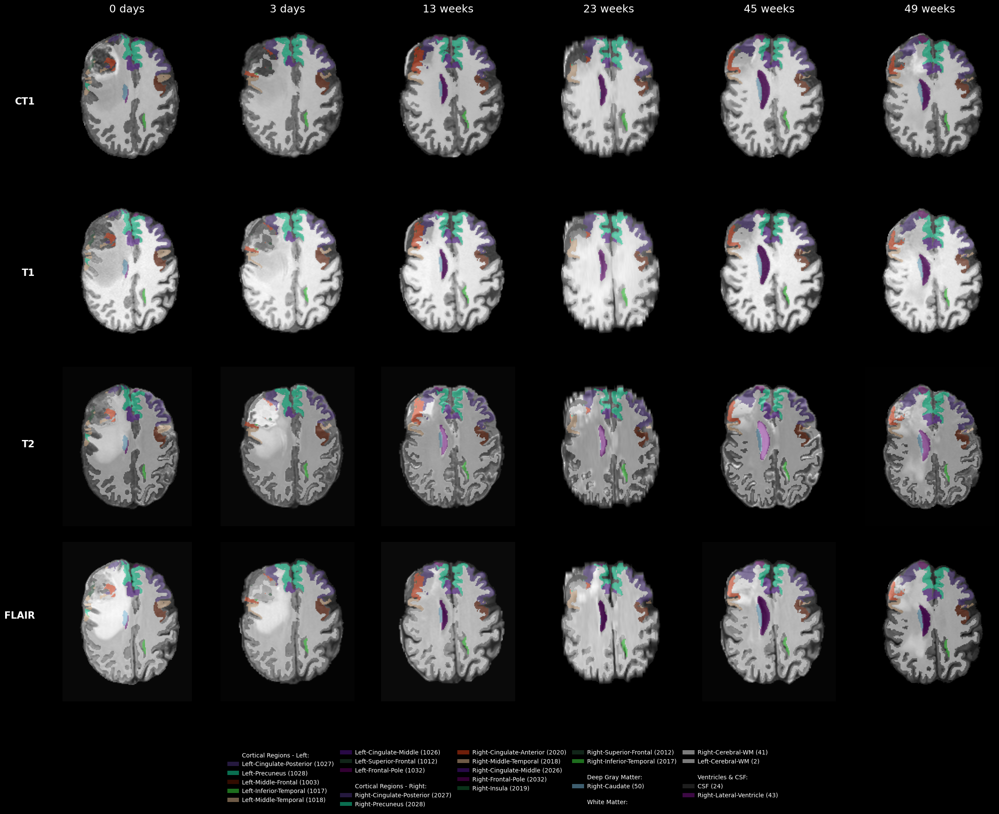

CPU times: user 46 s, sys: 2.41 s, total: 48.4 s
Wall time: 48.4 s


In [22]:
%%time
# Set up paths and parameters
lut_path = f"{home}/GitHub/glioma-growth/assets/FreeSurferColorLUT.txt"
base_dir = f"{home}/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg"
timepoints = ['week-000-1', 'week-000-2', 'week-013', 'week-023', 'week-045', 'week-049']
modalities = ['CT1', 'T1', 'T2', 'FLAIR']

# Create visualization
all_seg_values = create_longitudinal_visualization_with_synthseg(
    base_dir=base_dir,
    timepoints=timepoints,
    modalities=modalities,
    slice_idx=185,
    alpha=0.5,
    freesurfer_lut_path=lut_path
)

In [27]:
def create_longitudinal_visualization_with_synthseg(base_dir, timepoints, modalities, 
                                                  slice_idx=None, alpha=0.3,
                                                  freesurfer_lut_path=None):
    """
    Create a figure showing registered images across timepoints with synthseg overlay.
    Uses FreeSurfer LUT for coloring anatomical regions.
    """
    import matplotlib.pyplot as plt
    import nibabel as nib
    from pathlib import Path
    import numpy as np
    from matplotlib.patches import Patch
    
    def crop_brain_region(slice_data, seg_slice=None, padding=10):
        """Crop the brain region from the slice with padding."""
        rows = np.any(slice_data, axis=1)
        cols = np.any(slice_data, axis=0)
        rmin, rmax = np.where(rows)[0][[0, -1]]
        cmin, cmax = np.where(cols)[0][[0, -1]]
        
        rmin = max(rmin - padding, 0)
        rmax = min(rmax + padding, slice_data.shape[0])
        cmin = max(cmin - padding, 0)
        cmax = min(cmax + padding, slice_data.shape[1])
        
        cropped_slice = slice_data[rmin:rmax, cmin:cmax]
        if seg_slice is not None:
            cropped_seg = seg_slice[rmin:rmax, cmin:cmax]
            return cropped_slice, cropped_seg
        return cropped_slice
    
    # Load FreeSurfer LUT
    lut = load_freesurfer_lut(freesurfer_lut_path)
    print(f"Loaded FreeSurfer LUT with {len(lut)} color mappings")
    
    # Setup figure
    plt.style.use('dark_background')
    fig = plt.figure(figsize=(24, 20))
    fig.patch.set_facecolor('black')
    
    # Create subplot grid
    gs = fig.add_gridspec(len(modalities), len(timepoints), 
                         left=0.06, right=0.99, top=0.95, bottom=0.12,
                         hspace=0.1, wspace=0.05)
    axes = [[fig.add_subplot(gs[i, j]) for j in range(len(timepoints))] 
            for i in range(len(modalities))]
    
    time_labels = ['0 days', '3 days', '13 weeks', '23 weeks', '45 weeks', '49 weeks']
    reg_dir = Path(base_dir) / 'registered_timepoints'
    
    # Track all unique segmentation values
    all_seg_values = set()
    
    # Load and display images
    for i, mod in enumerate(modalities):
        for j, tp in enumerate(timepoints):
            mod_name = mod.replace('.nii.gz', '')
            img_path = reg_dir / f'{tp}_{mod_name}_registered.nii.gz'
            synthseg_path = reg_dir / f'{tp}_synthseg_registered.nii.gz'
            
            try:
                # Load modality image
                img = nib.load(str(img_path))
                data = img.get_fdata()
                
                # Load synthseg and ensure integer values
                synthseg = nib.load(str(synthseg_path))
                seg_data = np.round(synthseg.get_fdata()).astype(int)
                
                # Check LUT coverage
                unique_vals = np.unique(seg_data)
                missing_vals = [val for val in unique_vals if val not in lut]
                if missing_vals:
                    print(f"Warning: Missing LUT colors for values in {tp}: {missing_vals}")
                
                # Update all seen values
                all_seg_values.update(unique_vals)
                
                # Get slice
                if slice_idx is None:
                    slice_idx = data.shape[2] // 2
                
                slice_data = data[:, :, slice_idx]
                seg_slice = seg_data[:, :, slice_idx]
                
                # Apply orientation
                slice_data = np.rot90(slice_data, k=+1)
                slice_data = np.fliplr(slice_data)
                seg_slice = np.rot90(seg_slice, k=+1)
                seg_slice = np.fliplr(seg_slice)
                
                # Crop brain region
                slice_data, seg_slice = crop_brain_region(slice_data, seg_slice, padding=20)
                
                # Display base image
                axes[i][j].imshow(slice_data, cmap='gray')
                
                # Create overlay for each anatomical structure
                unique_slice_vals = np.unique(seg_slice)
                for val in unique_slice_vals:
                    if val in lut:
                        mask = (seg_slice == val)
                        if np.any(mask):
                            axes[i][j].imshow(mask, 
                                            cmap=plt.cm.colors.ListedColormap([lut[val]]),
                                            alpha=alpha * mask)
                
                axes[i][j].axis('off')
                axes[i][j].set_facecolor('black')
                
                # Add labels
                if j == 0:
                    row_positions = {
                        'CT1': 0.85,
                        'T1': 0.65,
                        'T2': 0.45,
                        'FLAIR': 0.25
                    }
                    fig.text(0.045, row_positions[mod_name], mod_name, 
                            fontsize=16, fontweight='bold', 
                            ha='right', va='center',
                            color='white')
                if i == 0:
                    axes[i][j].set_title(time_labels[j], fontsize=18, color='white')
                    
            except FileNotFoundError as e:
                print(f"Warning: File not found: {e.filename}")
                axes[i][j].text(0.5, 0.5, 'Missing', ha='center', va='center',
                              color='white')
                axes[i][j].axis('off')
    
    # Print summary of all segmentation values found
    print(f"\nFound {len(all_seg_values)} unique segmentation values across all timepoints")
    print(f"Value range: {min(all_seg_values)} to {max(all_seg_values)}")
    
    # Create legend for key anatomical structures with their LUT values
    key_structures = {
        2: 'Left-Cerebral-White-Matter',
        3: 'Right-Cerebral-White-Matter',
        4: 'Left-Cerebral-Cortex',
        5: 'Right-Cerebral-Cortex',
        7: 'Left-Lateral-Ventricle',
        8: 'Right-Lateral-Ventricle',
        10: 'Left-Thalamus',
        11: 'Right-Thalamus',
        12: 'Left-Caudate',
        13: 'Right-Caudate',
        14: 'Left-Putamen',
        15: 'Right-Putamen',
        16: 'Left-Pallidum',
        17: 'Right-Pallidum',
        18: 'Brain-Stem',
        24: 'CSF',
        28: 'Left-VentralDC',
        29: 'Right-VentralDC',
        44: 'Corpus-Callosum'
    }
    
    # Create legend elements with LUT values in labels
    legend_elements = [
        Patch(facecolor=lut[k], alpha=alpha, 
              label=f'{v} ({k})')  # Add LUT value to label
        for k, v in key_structures.items()
        if k in all_seg_values  # Only show structures that are present in the data
    ]
    
    # Add legend in multiple rows if needed
    n_cols = 6  # Reduced number of columns for better readability
    n_rows = (len(legend_elements) + n_cols - 1) // n_cols
    for row in range(n_rows):
        start_idx = row * n_cols
        end_idx = min((row + 1) * n_cols, len(legend_elements))
        fig.legend(handles=legend_elements[start_idx:end_idx],
                  loc='lower center',
                  bbox_to_anchor=(0.5, 0.02 + 0.04 * row),
                  ncol=n_cols,
                  fontsize=12,  # Slightly smaller font to accommodate longer labels
                  frameon=False)
    
    # Save figure
    output_path = reg_dir / 'longitudinal_registration_visualization_with_synthseg_all_alpha_1.png'
    plt.savefig(output_path, dpi=300, bbox_inches='tight',
                facecolor='black', edgecolor='none')
    print(f"Visualization saved to {output_path}")
    
    plt.show()
    plt.close()
    
    return all_seg_values

Loaded FreeSurfer LUT with 1475 color mappings

Found 99 unique segmentation values across all timepoints
Value range: 0 to 2035
Visualization saved to /home/arvid/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/registered_timepoints/longitudinal_registration_visualization_with_synthseg_all_alpha_1.png


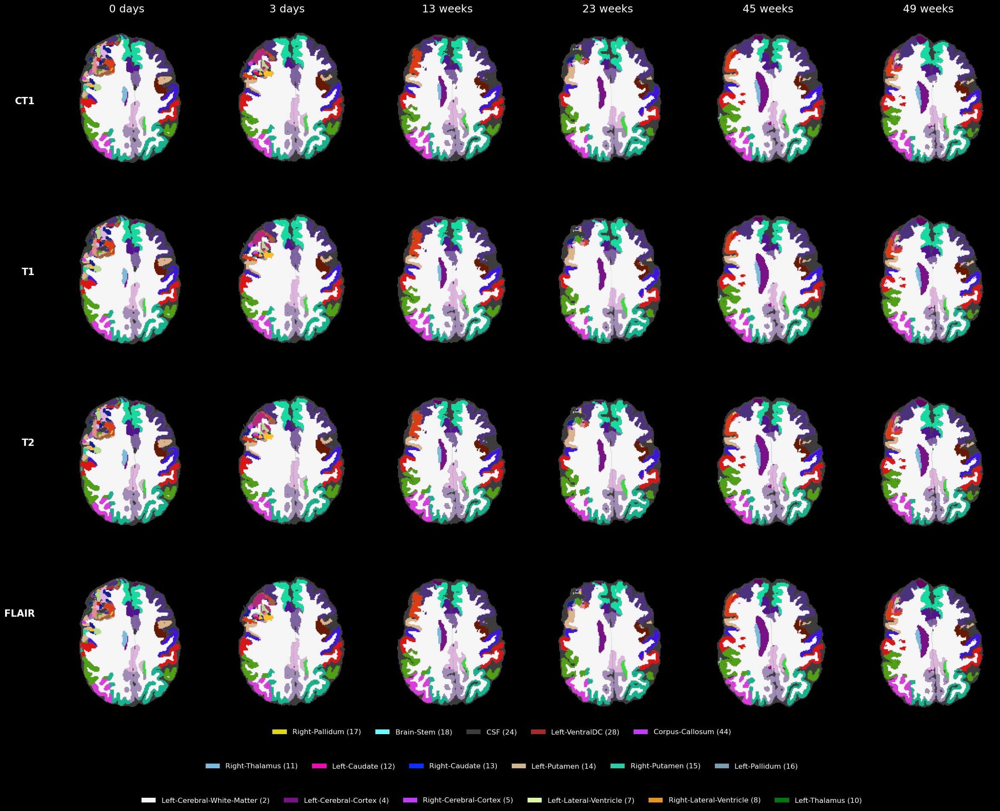

CPU times: user 1min 43s, sys: 1.56 s, total: 1min 45s
Wall time: 1min 45s


In [28]:
%%time
# Set up paths and parameters
lut_path = f"{home}/GitHub/glioma-growth/assets/FreeSurferColorLUT.txt"
base_dir = f"{home}/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg"
timepoints = ['week-000-1', 'week-000-2', 'week-013', 'week-023', 'week-045', 'week-049']
modalities = ['CT1', 'T1', 'T2', 'FLAIR']

# Create visualization
all_seg_values = create_longitudinal_visualization_with_synthseg(
    base_dir=base_dir,
    timepoints=timepoints,
    modalities=modalities,
    slice_idx=185,
    alpha=1.0,
    freesurfer_lut_path=lut_path
)

### Using FreeView for visualization

In [29]:
def launch_freeview_registered(fshome, timepoints, home):
    """
    Launch freeview to inspect registered images.
    
    Args:
        fshome (str): Path to FreeSurfer home directory
        timepoints (list): List of timepoint names (e.g., ['week-000-1', ...])
        home (str): User's home directory
    """
    import os
    import subprocess
    
    # Store current directory
    original_dir = os.getcwd()
    
    # Set up environment variables
    env = os.environ.copy()
    env.update({
        'FREESURFER_HOME': fshome,
        'PATH': f"{fshome}/bin:{env.get('PATH', '')}",
        'SUBJECTS_DIR': f"{home}/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg",
        'FSLDIR': '/usr/local/fsl'
    })
    env['PATH'] = f"{env['FSLDIR']}/bin:{env['PATH']}"
    
    # Source FreeSurfer's setup script
    setup_cmd = f"source {fshome}/SetUpFreeSurfer.sh"
    subprocess.run(setup_cmd, shell=True, executable='/bin/bash', env=env)
    
    # Source FSL's setup
    fsl_cmd = f". {env['FSLDIR']}/etc/fslconf/fsl.sh"
    subprocess.run(fsl_cmd, shell=True, executable='/bin/bash', env=env)
    
    # Change to SUBJECTS_DIR
    os.chdir(env['SUBJECTS_DIR'])
    
    # Construct freeview command with all registered images
    cmd = ['freeview', '-v']
    
    # Add each timepoint's images
    for tp in timepoints:
        cmd.extend([
            f"registered_timepoints/{tp}_T1_registered.nii.gz",
            f"registered_timepoints/{tp}_CT1_registered.nii.gz",
            f"registered_timepoints/{tp}_FLAIR_registered.nii.gz",
            f"registered_timepoints/{tp}_segmentation_registered.nii.gz:colormap=jet:opacity=0.8",
            f"registered_timepoints/{tp}_synthseg_registered.nii.gz:colormap=lut:opacity=0.8"
        ])
    
    # Add viewing parameters
    cmd.extend(['-ras', '24', '-2', '76'])
    
    # Execute freeview without checking return code
    subprocess.run(cmd, env=env)
    
    # Return to original directory
    os.chdir(original_dir)

# Example usage:
# timepoints = ['week-000-1', 'week-000-2', 'week-013', 'week-023', 'week-045', 'week-049']
# launch_freeview_registered(fshome, timepoints, home)

In [30]:
# Example usage:
timepoints = ['week-000-1', 'week-000-2', 'week-013', 'week-023', 'week-045', 'week-049']
launch_freeview_registered(fshome, timepoints, home)

INFO: using NIfTI-1 qform 
INFO: using NIfTI-1 qform 
